# Comparison of different model architectures

In [1]:
from util import get_root_path
import util
import torch
from data import AudioDataloader, MSPPodcast
from config import load_hydra_config
from IPython.display import Audio, display
import matplotlib.pyplot as plt

from models import HifiGAN, models_from_config

cfg = load_hydra_config("vc_xlsr", overrides=["data.dataset.segment_size=70000"])
dataloader = AudioDataloader(
    dataset=MSPPodcast(cfg.data, split="development", random_segmentation=False),
    cfg=cfg.data.dataloader,
    batch_size=1,
    shuffle=True,
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vocoder = HifiGAN(cfg.model.vocoder).to(device)
util.load_model(vocoder, "hifigan.pth", freeze=True)

models = {
    "evc_xlsr_f0": {
        "ckpt": get_root_path() / "ckpt" / "evc_xlsr_f0_input.pth",
        "cfg": "evc_xlsr",
    },
    "evc_xlsr_yin_l2_norm": {
        "ckpt": get_root_path() / "ckpt" / "evc_xlsr_yin_l2_norm.pth",
        "cfg": "evc_xlsr_yin_l2_norm",
    },
    "evc_xlsr_yin_spk_masking": {
        "ckpt": get_root_path() / "ckpt" / "evc_xlsr_yin_spk_masking.pth",
        "cfg": "evc_xlsr_yin",
    },
    "evc_xlsr_yin_flat_pitch": {
        "ckpt": get_root_path() / "ckpt" / "evc_xlsr_yin_flat_pitch.pth",
        "cfg": "evc_xlsr_yin",
    },
    "evc_xlsr_yin": {
        "ckpt": get_root_path() / "ckpt" / "evc_xlsr_yin.pth",
        "cfg": "evc_xlsr_yin",
    },
}


def plot_model_output(x, n_frames, model_name, t=None, t_n_frames=None, emo_level:int=None, pitch_shift:bool=False):
    if model_name not in models:
        raise ValueError(f"Checkpoint for {model_name} not found.")

    # Load config and models
    cfg_name = models[model_name]["cfg"]
    cfg = load_hydra_config(cfg_name)
    model, preprocessor, style_encoder = models_from_config(cfg, device)

    # Load checkpoint
    ckpt_path = models[model_name]["ckpt"]
    ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)

    model.load_state_dict(ckpt["model"])
    model.requires_grad_(False)
    model.eval()

    preprocessor.load_state_dict(ckpt["preprocessor"])
    preprocessor.requires_grad_(False)
    preprocessor.eval()

    style_encoder.load_state_dict(ckpt["style_encoder"])
    style_encoder.requires_grad_(False)
    style_encoder.eval()

    # Forward pass
    x = preprocessor(x, n_frames)

    if t is not None and t_n_frames is not None:
        t = preprocessor(t, t_n_frames)
        if emo_level is not None:
            g = style_encoder.emotion_conversion(t, emo_level).unsqueeze(-1)
        else:
            g = style_encoder(t).unsqueeze(-1)
        if pitch_shift:
            x.emb_pitch = preprocessor.pitch_encoder.yin_with_pitch_shift(x.audio, t.audio)
    else:
        if emo_level is not None:
            g = style_encoder.emotion_conversion(x, emo_level).unsqueeze(-1)
        else:
            g = style_encoder(x).unsqueeze(-1)

    y_mel, src_mel, ftr_mel = model(x, g, return_enc_out=True, n_time_steps=10)

    # Vocode
    enc = vocoder(src_mel + ftr_mel).squeeze(1)
    y = vocoder(y_mel).squeeze(1)

    # Plot
    fig, axs = plt.subplots(2, 3, figsize=(20, 5))
    axs[0,0].imshow(x.mel[0].cpu().numpy(), origin="lower")
    axs[0,0].set_title("Input mel spectrogram")
    axs[0,1].axis("off")
    axs[0,2].imshow(y_mel[0].cpu().numpy(), origin="lower")
    axs[0,2].set_title("Output mel spectrogram")
    axs[1,0].imshow(src_mel[0].cpu().numpy(), origin="lower")
    axs[1,0].set_title("Source mel spectrogram (encoder output)")
    axs[1,1].imshow((src_mel[0] + ftr_mel[0]).cpu().numpy(), origin="lower")
    axs[1,1].set_title("Encoder output")
    axs[1,2].imshow(ftr_mel[0].cpu().numpy(), origin="lower")
    axs[1,2].set_title("Filter mel spectrogram (encoder output)")
    plt.tight_layout()
    plt.show()

    # Audio
    display(Audio(enc.detach().cpu(), rate=cfg.data.dataset.sampling_rate))
    display(Audio(y.detach().cpu(), rate=cfg.data.dataset.sampling_rate))

In [32]:
x, n_frames = next(iter(dataloader))
x, n_frames = x.to(device), n_frames.to(device)
Audio(x.detach().cpu(), rate=cfg.data.dataset.sampling_rate)

## Reference: Emotion Conversion with Yingram and XLSR input

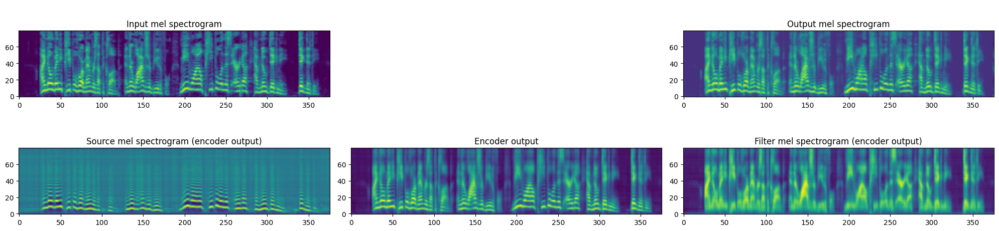

In [33]:
plot_model_output(x, n_frames, "evc_xlsr_yin", emo_level=1)

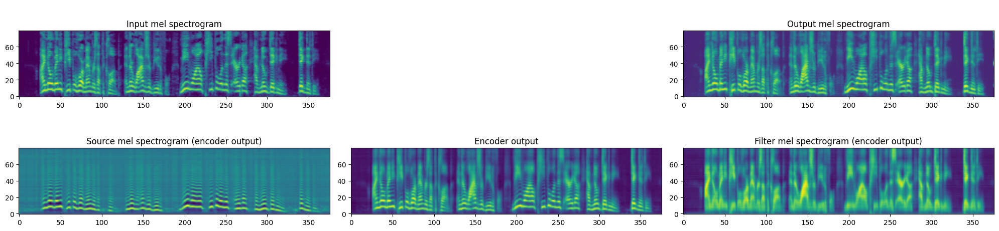

In [34]:
plot_model_output(x, n_frames, "evc_xlsr_yin", emo_level=7)

## L2-Normalized Embeddings

The output of the emotion embedding model has much lower variance than the meta-stylespeech embeddings.
Normalizing their magnitudes to one could avoid the gradients of the speaker embedding dominating the
conditioning process.

See: https://wiki.alexanderbaur.de/Model/Design%20Decisions%20and%20Considerations/#balance-variance

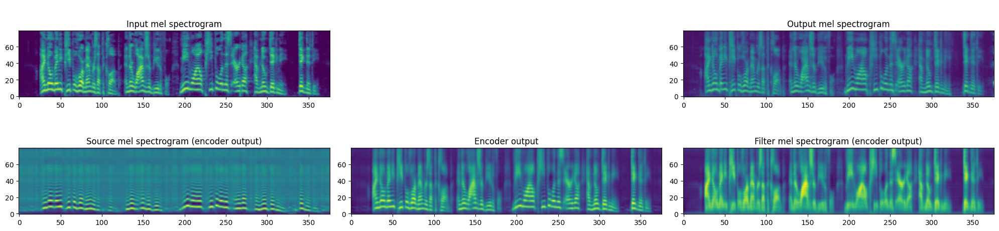

In [35]:
plot_model_output(x, n_frames, "evc_xlsr_yin_l2_norm", emo_level=1)

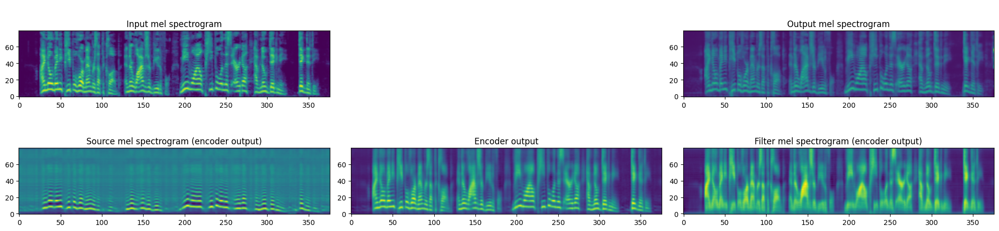

In [36]:
plot_model_output(x, n_frames, "evc_xlsr_yin_l2_norm", emo_level=7)

## Speaker Masking

To force the model to learn more from the emotion embeddings, mask speaker embedding
in 30% of each batch.

See: https://wiki.alexanderbaur.de/Model/Design%20Decisions%20and%20Considerations/#speaker-masking-curriculum

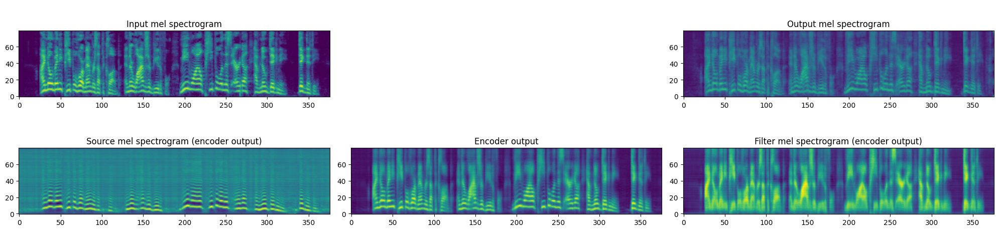

In [37]:
plot_model_output(x, n_frames, "evc_xlsr_yin_spk_masking", emo_level=1)

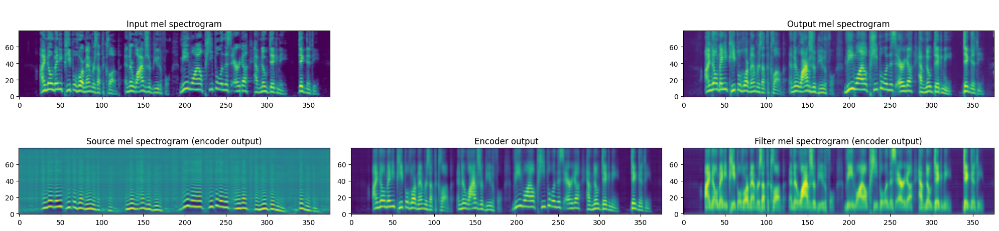

In [38]:
plot_model_output(x, n_frames, "evc_xlsr_yin_spk_masking", emo_level=7)

## F0 Input

The Yingram might be too expressive and provide too much pitch information, so that the model does not learn
how to perturb the pitch. Using a less expressive input might help. Here, the original model is used with
emotion conditioning. The inputs are the normalized and vector-quantized F0.

Like the original model, the learned filter representation is now very expressive and contains a lot of pitch
information as well. This might again inhibit the model from learning how to perturb the pitch.

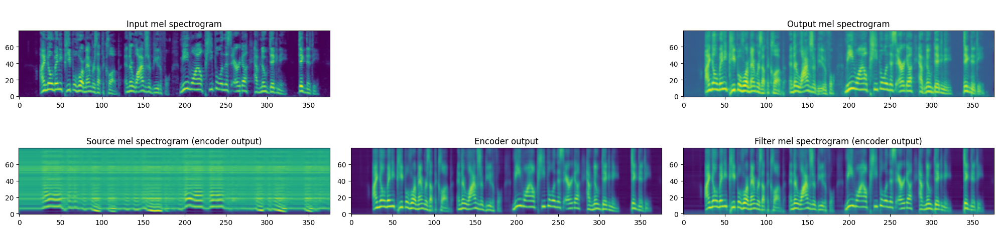

In [39]:
plot_model_output(x, n_frames, "evc_xlsr_f0", emo_level=1)

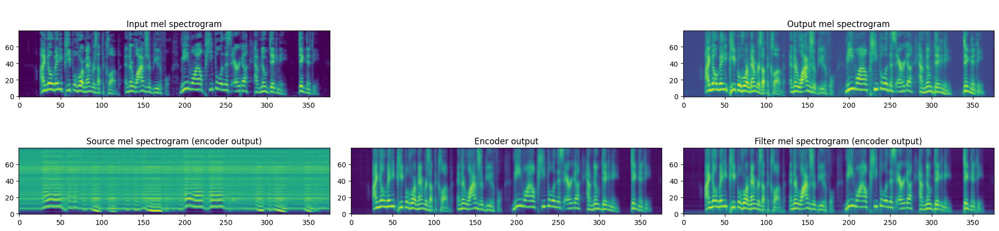

In [40]:
plot_model_output(x, n_frames, "evc_xlsr_f0", emo_level=7)

## Yingram with Flattened Pitch Conture

To further disentangle emotion related pitch information, the pitch of the input audio is flattened during training.
This might encourage the model to learn more flexible pitch perturbations.

See: https://wiki.alexanderbaur.de/Model/Design%20Decisions%20and%20Considerations/#more-pitch-perturbation

This model wasn't trained for as long as the others, as it requires resynthesizing the source audio with a flat pitch using
Pyworld, which is a slow process.

Here, the diffusion model plays a more relevant role and actively generates variations in the pitch.


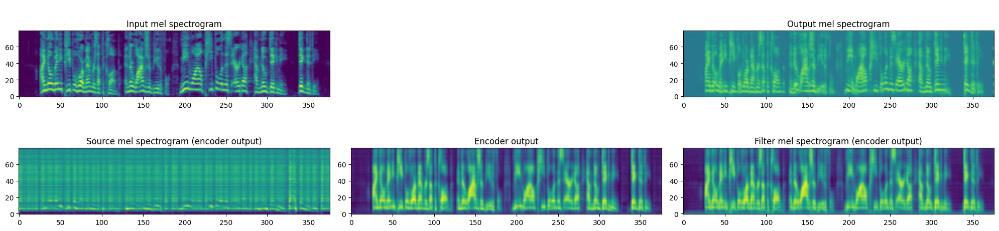

In [41]:
plot_model_output(x, n_frames, "evc_xlsr_yin_flat_pitch", emo_level=1)

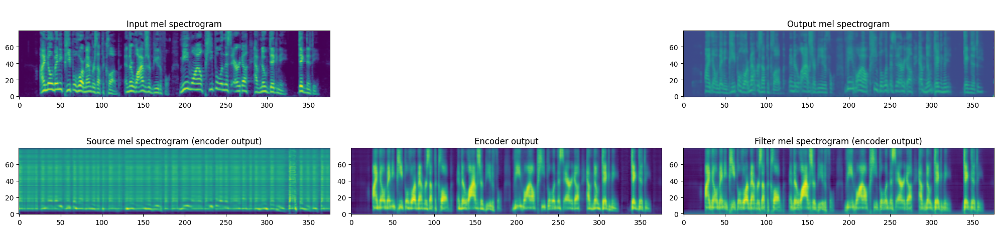

In [42]:
plot_model_output(x, n_frames, "evc_xlsr_yin_flat_pitch", emo_level=7)